<a href="https://colab.research.google.com/github/mlubega/cv/blob/master/OCR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16
!pip install matplotlib
!pip install numpy
!pip install pandas
!pip install cvlib
!pip install Pillow



    100% |████████████████████████████████| 25.0MB 1.4MB/s 
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.
  Found existing installation: opencv-python 3.4.5.20
    Uninstalling opencv-python-3.4.5.20:
      Successfully uninstalled opencv-python-3.4.5.20
    100% |████████████████████████████████| 30.6MB 1.3MB/s 
  Found existing installation: opencv-contrib-python 3.4.3.18
    Uninstalling opencv-contrib-python-3.4.3.18:
      Successfully uninstalled opencv-contrib-python-3.4.3.18
    100% |████████████████████████████████| 10.0MB 4.2MB/s 
  Stored in directory: /root/.cache/pip/wheels/91/a7/81/c62a40bd5ea422e2fb92d5e3afe6f2dd24aba34c01994cca8f
Successfully built cvlib


In [0]:
#Enable CUDA GPU
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2018 NVIDIA Corporation
Built on Sat_Aug_25_21:08:01_CDT_2018
Cuda compilation tools, release 10.0, V10.0.130


In [35]:
%cd /content/drive/My\ Drive/Colab\ Notebooks/images
!ls -l 

/content/drive/My Drive/Colab Notebooks/images
total 103874
-rw------- 1 root root 96662756 Apr 19 18:19 frozen_east_text_detection.pb
-rw------- 1 root root  1610413 Apr 18 22:49 jack.jpeg
-rw------- 1 root root  1603791 Apr 18 22:49 jack_side.jpeg
-rw------- 1 root root  5081557 Apr 18 22:49 sepher.jpg
-rw------- 1 root root  1407219 Apr 18 22:49 sophie_side.jpeg


In [0]:
import cv2
import numpy as np
import os
import time
import cvlib
from google.colab.patches import cv2_imshow
from PIL import Image

Using TensorFlow backend.


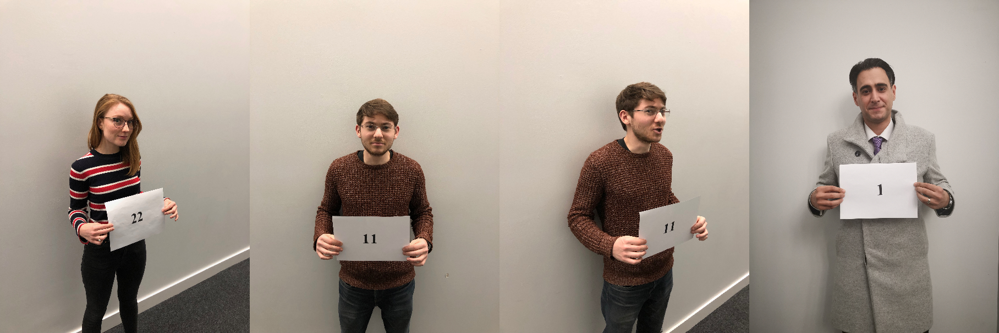

In [0]:
sophie = cv2.imread('sophie_side.jpeg')
jack = cv2.imread('jack.jpeg')
jack_side = cv2.imread('jack_side.jpeg')
sepher = cv2.imread('sepher.jpg')

#print(sophie.shape)
#print(jack.shape)
#print(jack_side.shape)
#print(sepher.shape)


soph = cv2.resize(sophie,None,fx=0.15,fy=0.15,interpolation=cv2.INTER_CUBIC)
jack1 = cv2.resize(jack,None,fx=0.15,fy=0.15,interpolation=cv2.INTER_CUBIC)
jack2 = cv2.resize(jack_side,None,fx=0.15,fy=0.15,interpolation=cv2.INTER_CUBIC)
h, w, c= jack2.shape
seph = cv2.resize(sepher,(w, h))

amigos = np.hstack((soph, jack1, jack2, seph))
cv2_imshow(amigos)

# PyTessseract

In [0]:
!pip install pytesseract
!pip install tesseract


In [0]:

! pip install tesseract-ocr

  Using cached https://files.pythonhosted.org/packages/e2/0d/dcee3dd0fc4c7bcd18125a98f8ba6d9db7aecaa40770595203e312649587/tesseract-ocr-0.0.1.tar.gz
  Failed building wheel for tesseract-ocr
  Running setup.py clean for tesseract-ocr
Failed to build tesseract-ocr
  Running setup.py install for tesseract-ocr ... error
Command "/usr/bin/python3 -u -c "import setuptools, tokenize;__file__='/tmp/pip-install-_hx9i7r3/tesseract-ocr/setup.py';f=getattr(tokenize, 'open', open)(__file__);code=f.read().replace('\r\n', '\n');f.close();exec(compile(code, __file__, 'exec'))" install --record /tmp/pip-record-kwm_rney/install-record.txt --single-version-externally-managed --compile" failed with error code 1 in /tmp/pip-install-_hx9i7r3/tesseract-ocr/


In [0]:
import pytesseract
from PIL import Image

In [0]:

text = pytesseract.image_to_string(seph) 
print(text)

TesseractNotFoundError: ignored

# Simple Thresholding


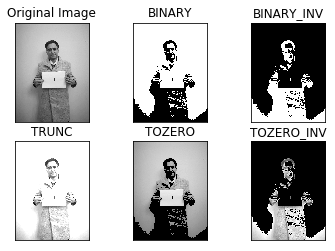

In [0]:
sp = seph.copy()
so = soph.copy()
jo = jack1.copy()



import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.cvtColor(sp, cv2.COLOR_BGR2GRAY)
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

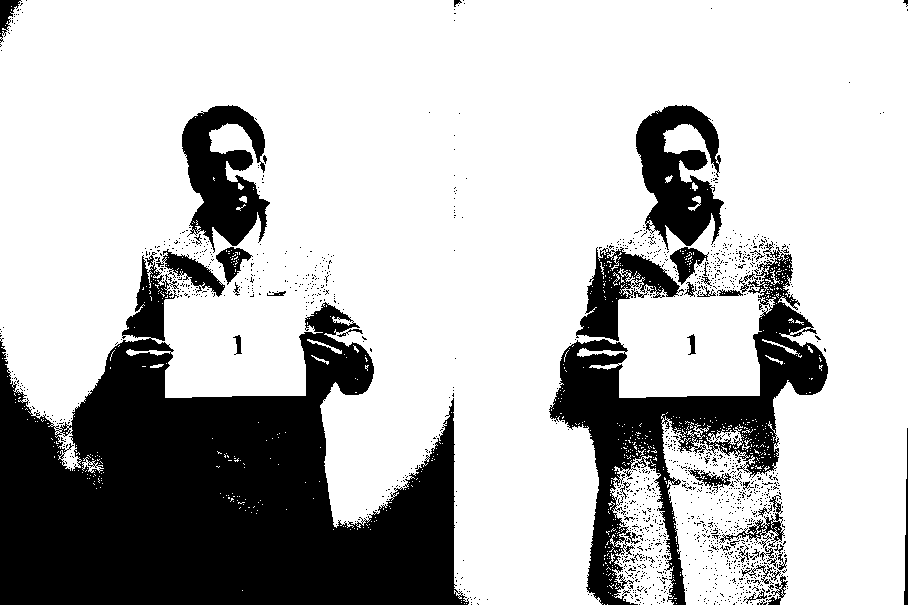

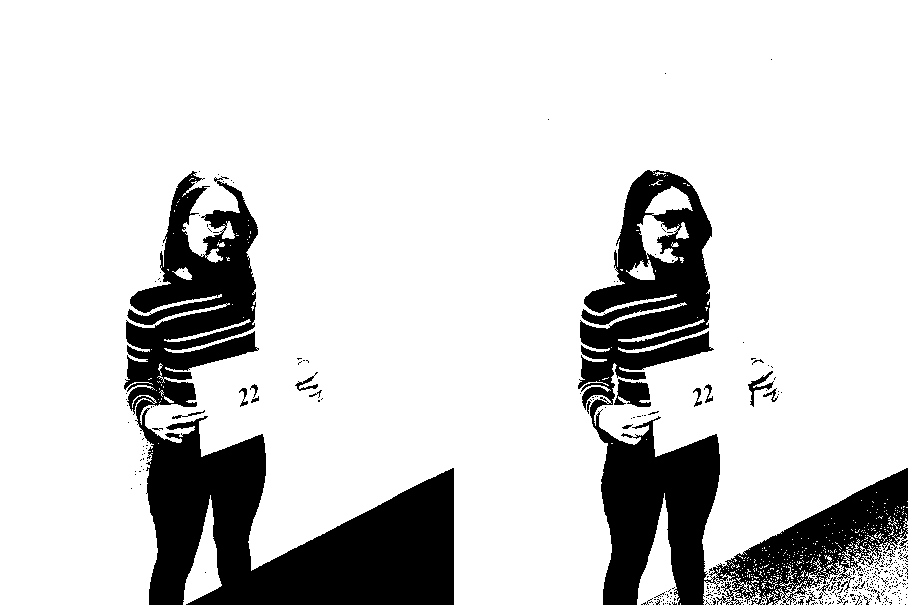

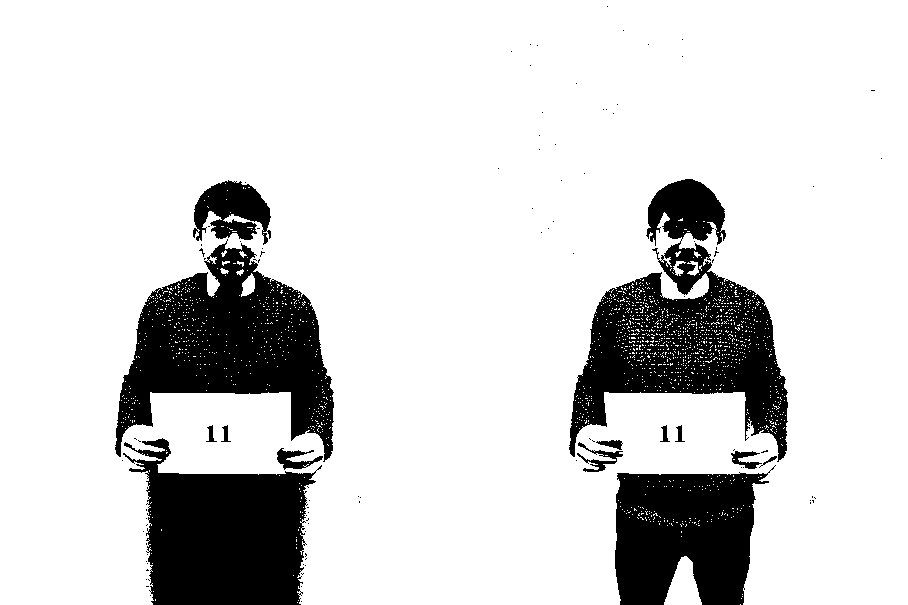

In [0]:
grayS1 = cv2.cvtColor(sp, cv2.COLOR_BGR2GRAY)
grayS2 = cv2.cvtColor(so, cv2.COLOR_BGR2GRAY)
grayS3 = cv2.cvtColor(jo, cv2.COLOR_BGR2GRAY)
retval, graythresh1 = cv2.threshold(grayS1, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh1 = cv2.adaptiveThreshold(grayS1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)

retval, graythresh2 = cv2.threshold(grayS2, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh2 = cv2.adaptiveThreshold(grayS2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)

retval, graythresh3 = cv2.threshold(grayS3, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh3 = cv2.adaptiveThreshold(grayS3, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)


thresh1  = np.hstack((graythresh1, adaptthresh1))
cv2_imshow(thresh1)

thresh2  = np.hstack((graythresh2, adaptthresh2))
cv2_imshow(thresh2)

thresh3 = np.hstack((graythresh3, adaptthresh3))
cv2_imshow(thresh3)

# Thresholding & Opening

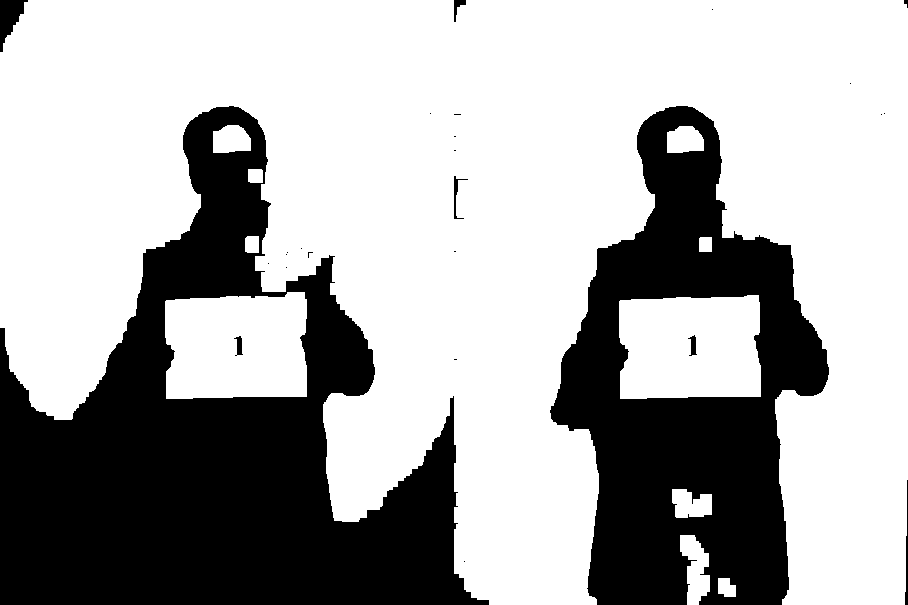

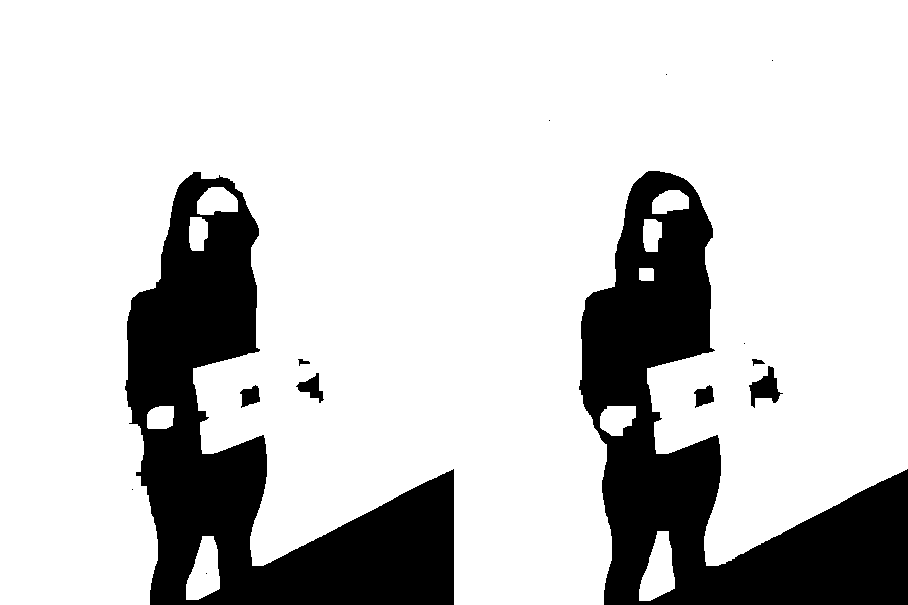

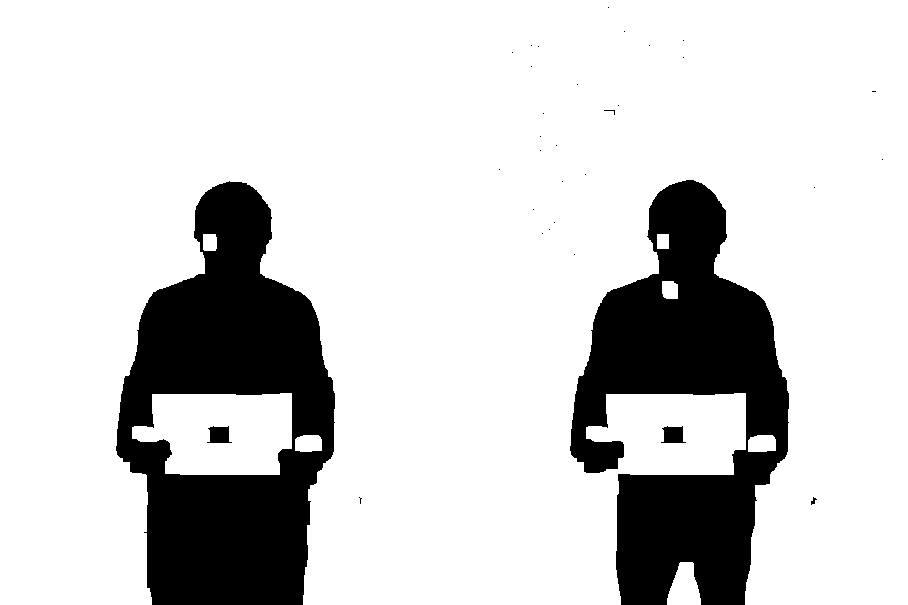

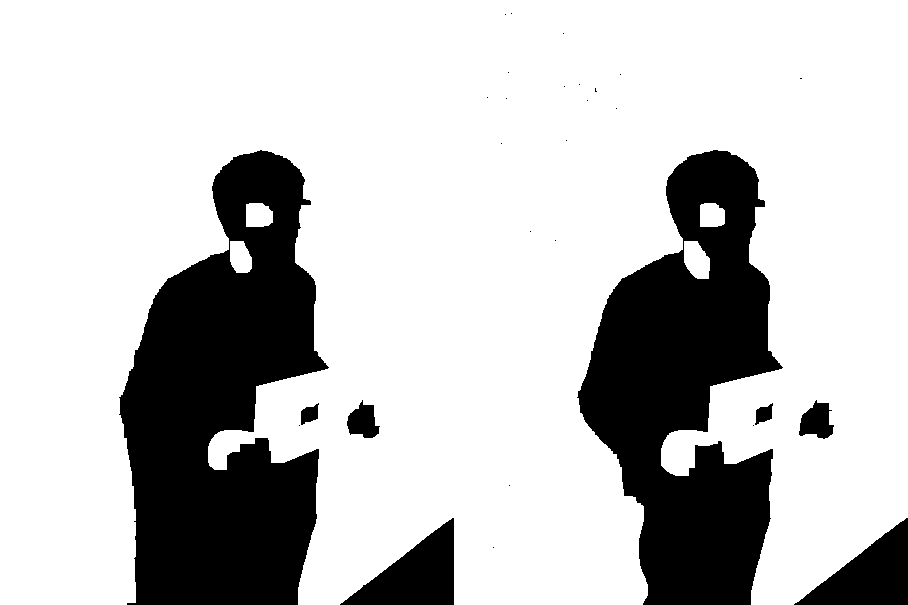

In [49]:
sp = seph.copy()
so = soph.copy()
jo = jack1.copy()
jo2 = jack2.copy()

kernel = np.ones((12,12),np.uint8)


grayS1 = cv2.cvtColor(sp, cv2.COLOR_BGR2GRAY)
grayS2 = cv2.cvtColor(so, cv2.COLOR_BGR2GRAY)
grayS3 = cv2.cvtColor(jo, cv2.COLOR_BGR2GRAY)
grayS4 = cv2.cvtColor(jo2, cv2.COLOR_BGR2GRAY)
retval, graythresh1 = cv2.threshold(grayS1, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh1 = cv2.adaptiveThreshold(grayS1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)
opening1a = cv2.morphologyEx(graythresh1, cv2.MORPH_OPEN, kernel)
opening1b = cv2.morphologyEx(adaptthresh1, cv2.MORPH_OPEN, kernel)


retval, graythresh2 = cv2.threshold(grayS2, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh2 = cv2.adaptiveThreshold(grayS2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)
opening2a = cv2.morphologyEx(graythresh2, cv2.MORPH_OPEN, kernel)
opening2b = cv2.morphologyEx(adaptthresh2, cv2.MORPH_OPEN, kernel)

retval, graythresh3 = cv2.threshold(grayS3, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh3 = cv2.adaptiveThreshold(grayS3, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)
opening3a = cv2.morphologyEx(graythresh3, cv2.MORPH_OPEN, kernel)
opening3b = cv2.morphologyEx(adaptthresh3, cv2.MORPH_OPEN, kernel)

retval, graythresh4 = cv2.threshold(grayS4, 200, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
adaptthresh4 = cv2.adaptiveThreshold(grayS4, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 301, 10)
opening4a = cv2.morphologyEx(graythresh4, cv2.MORPH_OPEN, kernel)
opening4b = cv2.morphologyEx(adaptthresh4, cv2.MORPH_OPEN, kernel)


thresh1  = np.hstack((opening1a, opening1b))
cv2_imshow(thresh1)

thresh2  = np.hstack((opening2a, opening2b))
cv2_imshow(thresh2)

thresh3 = np.hstack((opening3a, opening3b))
cv2_imshow(thresh3)

thresh4 = np.hstack((opening4a, opening4b))
cv2_imshow(thresh4)

700.0
1


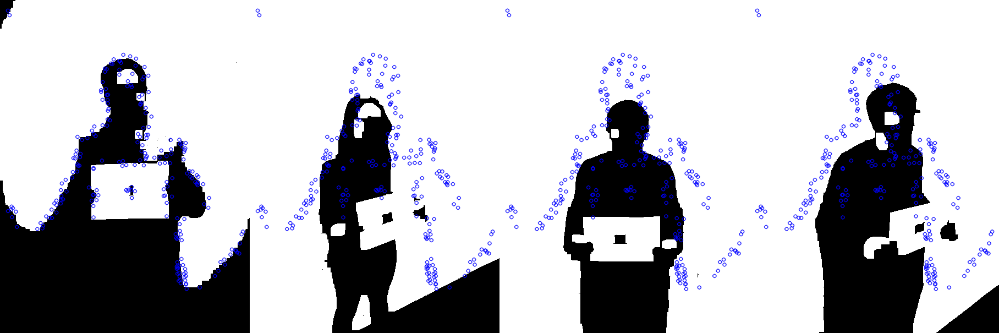

In [52]:
surf = cv2.xfeatures2d.SURF_create(hessianThreshold=700, nOctaves=1, nOctaveLayers=3) #what threshold?
surf.setExtended(True)

print(surf.getHessianThreshold())
print(surf.getNOctaves() )

def getSURFFeatures(img):
    #gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, desc = surf.detectAndCompute(img, None)
    return kp, desc
  
  
  
  
v1 = opening1a.copy()
kp1, desc1 = getSURFFeatures(v1)
img1 = cv2.drawKeypoints(v1,kp1,None,(255,0,0),2)

v2 = opening2a.copy()
kp2, desc2 = getSURFFeatures(v2)
img2 = cv2.drawKeypoints(v2,kp1,None,(255,0,0),2)

    
v3 = opening3a.copy()
kp3, desc3 = getSURFFeatures(v3)
img3 = cv2.drawKeypoints(v3,kp1,None,(255,0,0),2)
    
v4 = opening4a.copy()
kp4, desc4 = getSURFFeatures(v4)
img4 = cv2.drawKeypoints(v4,kp1,None,(255,0,0),2)

  

group = np.hstack((img1, img2, img3, img4))

cv2_imshow(group)

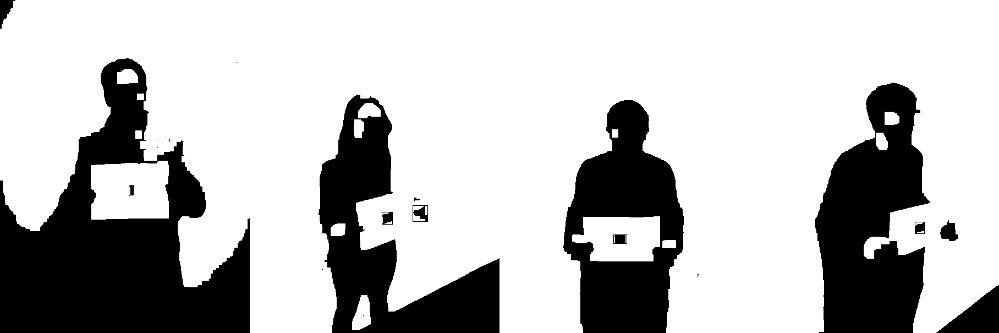

In [56]:



vis1 = opening1a.copy()
mser = cv2.MSER_create(_delta=10, _max_area=500, _max_variation=0.1)
#gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis1)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis1, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
      
      
vis2 = opening2a.copy()
#mser = cv2.MSER_create()
#gray2 = cv2.cvtColor(vis2, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis2)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis2, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
vis3 = opening3a.copy()
#mser = cv2.MSER_create(
#gray3 = cv2.cvtColor(vis3, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis3)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis3, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
    
vis4 = opening4a.copy()
#mser = cv2.MSER_create()
#gray4 = cv2.cvtColor(vis4, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis4)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis4, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
  

group = np.hstack((vis1, vis2, vis3, vis4))

cv2_imshow(group)

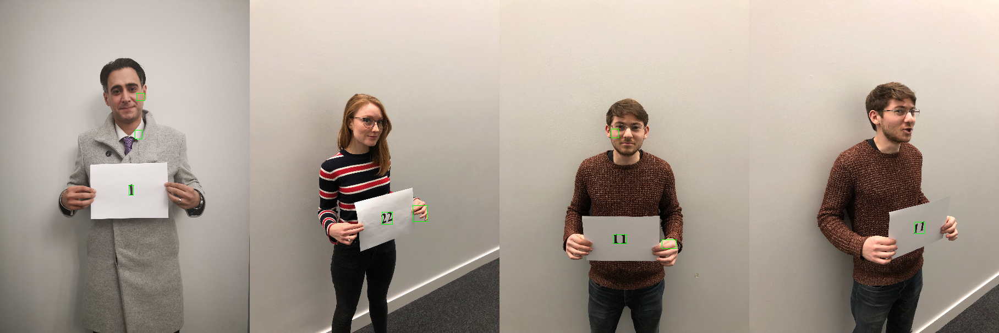

In [57]:
i1 = seph.copy()
i2 = soph.copy()
i3 = jack1.copy()
i4 = jack2.copy()


vis1 = opening1a.copy()
mser = cv2.MSER_create(_delta=10, _max_area=500, _max_variation=0.1)
#gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis1)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(i1, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
      
      
vis2 = opening2a.copy()
#mser = cv2.MSER_create()
#gray2 = cv2.cvtColor(vis2, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis2)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(i2, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
vis3 = opening3a.copy()
#mser = cv2.MSER_create(
#gray3 = cv2.cvtColor(vis3, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis3)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(i3, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
    
vis4 = opening4a.copy()
#mser = cv2.MSER_create()
#gray4 = cv2.cvtColor(vis4, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(vis4)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(i4, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
  

group = np.hstack((i1, i2, i3, i4))

cv2_imshow(group)

# Color Thresholding

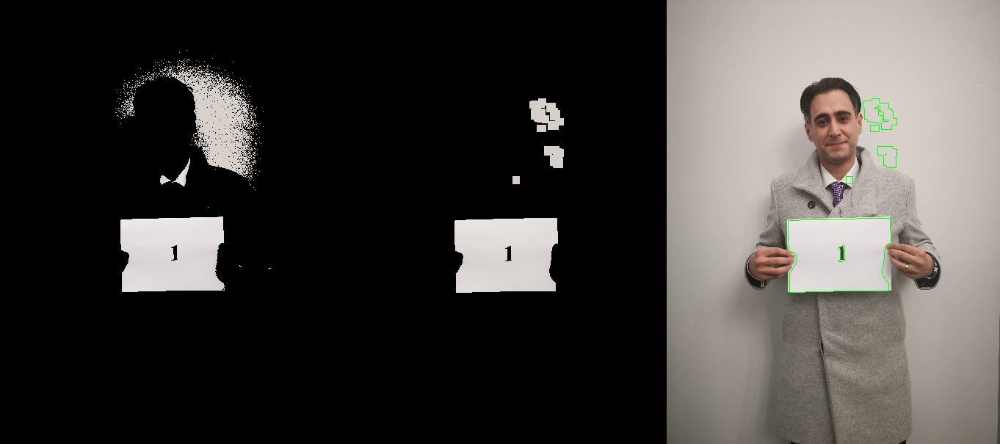

In [37]:
img = seph.copy()

#color thresholding
lower = np.array([200,200,200])
upper = np.array([255,255,255])

mask = cv2.inRange(img, lower, upper)
res = cv2.bitwise_and(img,img, mask= mask)


#opening to remove noise
kernel = np.ones((10,10),np.uint8)
opening = cv2.morphologyEx(res, cv2.MORPH_OPEN, kernel)

gray = cv2.cvtColor(opening, cv2.COLOR_RGB2GRAY)
im2, contours, hierarchy= cv2.findContours(gray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
c_img = cv2.drawContours(img, contours, -1, (0,255,0), 1)

#print(res.shape)
#print(opening.shape)
#print(c_img.shape)

thresh = np.hstack((res, opening, c_img))
cv2_imshow(thresh)

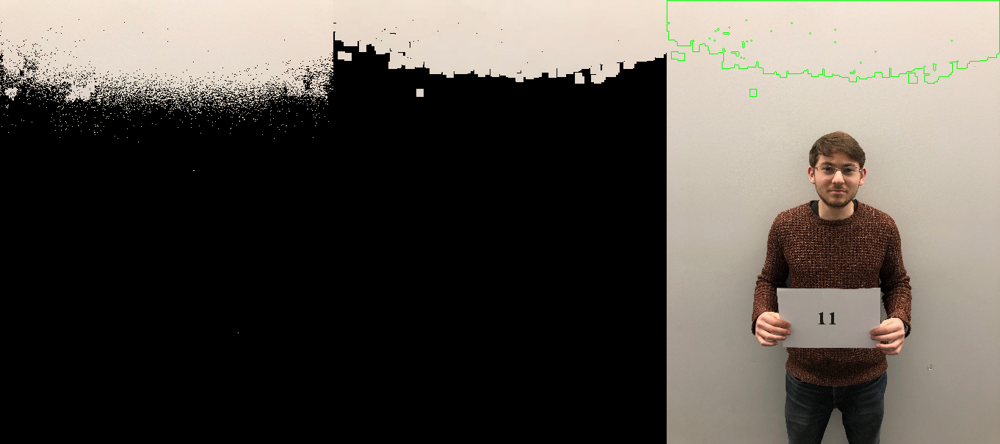

In [0]:
img = jack1.copy()

#color thresholding
lower = np.array([200,200,200])
upper = np.array([255,255,255])

mask = cv2.inRange(img, lower, upper)
res = cv2.bitwise_and(img,img, mask= mask)


#opening to remove noise
kernel = np.ones((10,10),np.uint8)
opening = cv2.morphologyEx(res, cv2.MORPH_OPEN, kernel)

gray = cv2.cvtColor(opening, cv2.COLOR_RGB2GRAY)
im2, contours, hierarchy= cv2.findContours(gray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
c_img = cv2.drawContours(img, contours, -1, (0,255,0), 1)

#print(res.shape)
#print(opening.shape)
#print(c_img.shape)

thresh = np.hstack((res, opening, c_img))
cv2_imshow(thresh)

# SURF Features

700.0
2


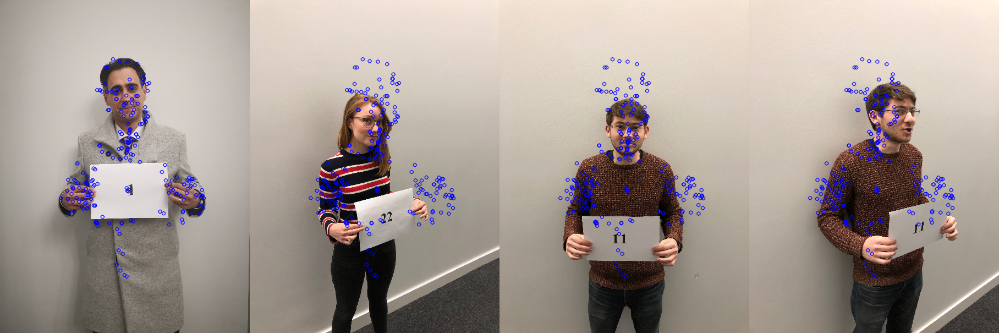

In [36]:
surf = cv2.xfeatures2d.SURF_create(hessianThreshold=700, nOctaves=2, nOctaveLayers=3) #what threshold?
surf.setExtended(True)

print(surf.getHessianThreshold())
print(surf.getNOctaves() )

def getSURFFeatures(img):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, desc = surf.detectAndCompute(gray_img, None)
    return kp, desc
  
  
  
  
v1 = seph.copy()
kp1, desc1 = getSURFFeatures(v1)
img1 = cv2.drawKeypoints(v1,kp1,None,(255,0,0),2)

v2 = soph.copy()
kp2, desc2 = getSURFFeatures(v2)
img2 = cv2.drawKeypoints(v2,kp1,None,(255,0,0),2)

    
v3 = jack1.copy()
kp3, desc3 = getSURFFeatures(v3)
img3 = cv2.drawKeypoints(v3,kp1,None,(255,0,0),2)
    
v4 = jack2.copy()
kp4, desc4 = getSURFFeatures(v4)
img4 = cv2.drawKeypoints(v4,kp1,None,(255,0,0),2)

  

group = np.hstack((img1, img2, img3, img4))

cv2_imshow(group)

# MSER


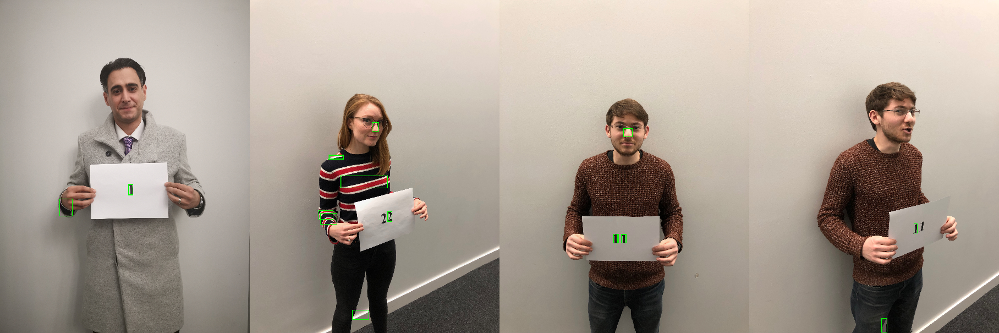

In [0]:
vis1 = seph.copy()
mser = cv2.MSER_create(_delta=10, _max_area=500, _max_variation=0.1)
gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(gray1)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis1, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
      
      
vis2 = soph.copy()
#mser = cv2.MSER_create()
gray2 = cv2.cvtColor(vis2, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(gray2)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis2, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
vis3 = jack1.copy()
#mser = cv2.MSER_create()
gray3 = cv2.cvtColor(vis3, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(gray3)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis3, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
    
    
vis4 = jack2.copy()
#mser = cv2.MSER_create()
gray4 = cv2.cvtColor(vis4, cv2.COLOR_BGR2GRAY)
regions, _ = mser.detectRegions(gray4)
for p in regions:
    xmax, ymax = np.amax(p, axis=0)
    xmin, ymin = np.amin(p, axis=0)
    cv2.rectangle(vis4, (xmin,ymax), (xmax,ymin), (0, 255, 0), 1)
  

group = np.hstack((vis1, vis2, vis3, vis4))

cv2_imshow(group)

# Canny Edges

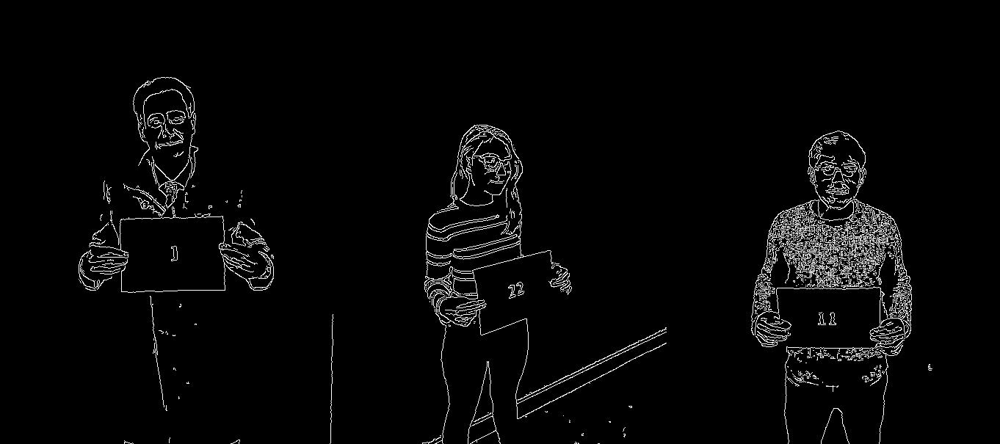

In [0]:
vis1 = seph.copy()
gray1 = cv2.cvtColor(vis1, cv2.COLOR_BGR2GRAY)
edges1 = cv2.Canny(gray,100,200)


vis2 = soph.copy()
gray2 = cv2.cvtColor(vis2, cv2.COLOR_BGR2GRAY)
edges2 = cv2.Canny(gray2,100,200)

vis3 = jack1.copy()
gray3 = cv2.cvtColor(vis3, cv2.COLOR_BGR2GRAY)
edges3 = cv2.Canny(gray3,100,200)

edges = np.hstack((edges1, edges2, edges3))

cv2_imshow(edges)
    

# Hough Lines

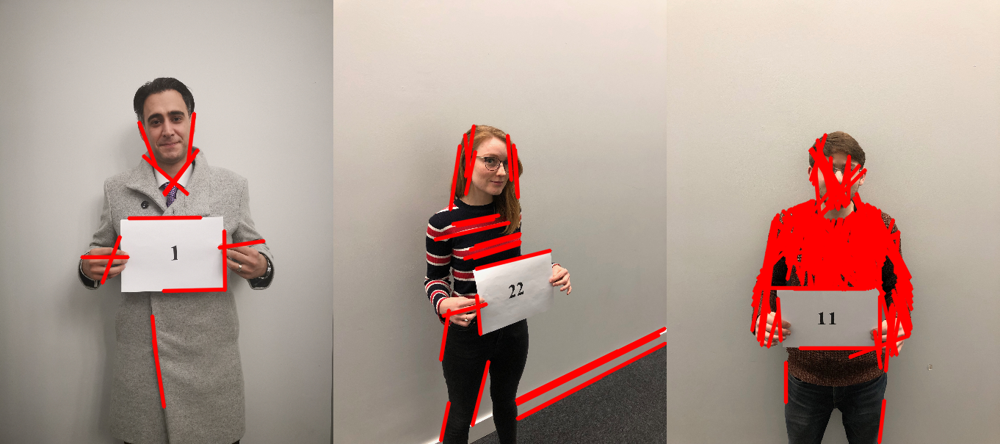

In [0]:
sp = seph.copy()
so = soph.copy()
jo = jack1.copy()
        
linesP = cv2.HoughLinesP(edges1, 1, np.pi / 180, 50, None, 50, 10)
#print(linesP)
if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv2.line(sp, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
        
        
linesP = cv2.HoughLinesP(edges2, 1, np.pi / 180, 50, None, 50, 10)
#print(linesP)
if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv2.line(so, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
        
linesP = cv2.HoughLinesP(edges3, 1, np.pi / 180, 50, None, 50, 10)
#print(linesP)
if linesP is not None:
    for i in range(0, len(linesP)):
        l = linesP[i][0]
        cv2.line(jo, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
        
lies = np.hstack((sp, so, jo))       
        
cv2_imshow(lies)

# Corners : Good Features To Track

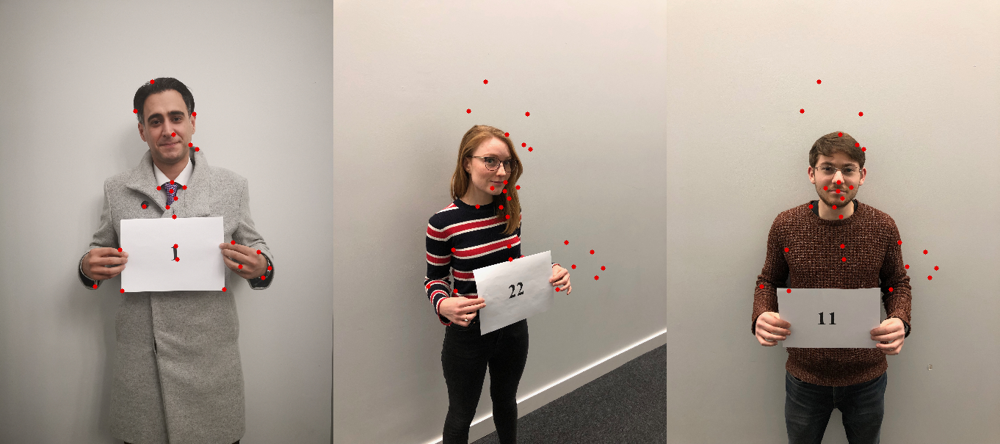

In [0]:
s1 = seph.copy()
s2 = soph.copy()
j1 = jack1.copy()

test1 = cv2.cvtColor(s1, cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(test,25,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(s1,(x,y),3,(0,0,225),-1)
    
test2 = cv2.cvtColor(s2, cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(test,25,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(s2,(x,y),3,(0,0,225),-1)
    
    
test3 = cv2.cvtColor(j1, cv2.COLOR_BGR2GRAY)
corners = cv2.goodFeaturesToTrack(test,25,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(j1,(x,y),3,(0,0,225),-1)
    
    
spots = np.hstack((s1, s2, j1))

cv2_imshow(spots)

# Blob Stuff

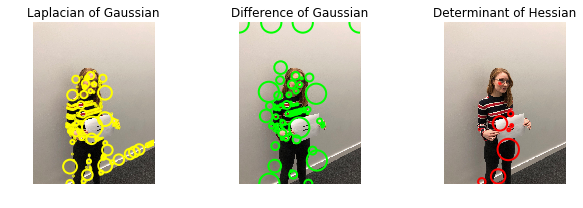

In [0]:
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
import matplotlib.pyplot as plt


image = cv2.cvtColor(soph,cv2.COLOR_BGR2RGB)
image_gray = rgb2gray(image)

#Laplacian of Gaussian
blobs_log = blob_log(image_gray, max_sigma=40, num_sigma=10, threshold=.1)
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2) # Compute radii in the 3rd column.

#Difference of Gaussian
blobs_dog = blob_dog(image_gray, max_sigma=40, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)


#Determinant of Hessian
blobs_doh = blob_doh(image_gray, max_sigma=40, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]

colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian', 'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image, interpolation='nearest')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

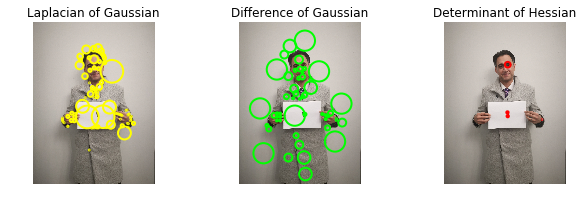

In [0]:
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray
import matplotlib.pyplot as plt


image = cv2.cvtColor(seph,cv2.COLOR_BGR2RGB)
image_gray = rgb2gray(image)

#Laplacian of Gaussian
blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2) # Compute radii in the 3rd column.

#Difference of Gaussian
blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)


#Determinant of Hessian
blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]

colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian', 'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True)
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image, interpolation='nearest')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

# Color Segmentation